## Imports

In [11]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

from astropy.table import Table
import astropy.coordinates as coord
import astropy.units as u

import galstreams
import pandas as pd
pd.set_option('display.max_rows', None)

import pickle

%matplotlib inline
%config InlineBackend.figure_format='retina'
plt.style.use('notebook')

In [2]:
mwstreams = galstreams.MWStreams(implement_Off=True)

Initializing galstreams library from master_log... 


In [3]:
mwstreams.summary

,Imp,On,TrackName,Name,TrackRefs,TrackRefsLatex,Notes,from-Members,width_phi2,width_phi2_Ref,...,distance_mid,ra_pole,dec_pole,InfoFlags,has_empirical_track,has_D,has_pm,has_vrad,DiscoveryRefs,ID
TrackName,,,,,,,,,,,,,,,,,,,,,
20.0-1-M18,po,True,20.0-1-M18,20.0-1,mateu2018,Mateu2018,-,0,1.80,Riley2020,...,26.839948,235.758575,38.821881,0000,0,0,0,0,Mateu2018,1
300S-F18,st,True,300S-F18,300S,fu2018,Fu2018,-,0,0.40,Fu2018,...,15.929409,308.056470,72.509388,1101,1,1,0,1,"NiedersteOstholt2009,Simon2011",2
AAU-ATLAS-L21,st,True,AAU-ATLAS-L21,AAU-ATLAS,li2021,Li2021,-,1,0.30,Li2021,...,21.478244,74.259067,47.933124,1111,1,1,1,1,Koposov2014,3
AAU-AliqaUma-L21,st,True,AAU-AliqaUma-L21,AAU-AliqaUma,li2021,Li2021,-,1,0.26,Li2021,...,21.981943,74.259067,47.933124,1111,1,1,1,1,Shipp2018,4
ACS-R21,st,True,ACS-R21,ACS,ramos2021,Ramos2021,-,0,2.10,Riley2020,...,11.700000,212.301639,-4.733141,1110,1,1,1,0,Grillmair2006_acs,5
ATLAS-I21,st,False,ATLAS-I21,AAU-ATLAS,ibata2021,Ibata2021,-,1,0.35,from-Members,...,24.642130,80.544842,44.626077,1111,1,1,1,1,Koposov2014,
ATLAS-I24,st,False,ATLAS-I24,AAU-ATLAS,ibata2024,Ibata2024,-,1,0.41,from-Members,...,1.000000,76.343232,47.439685,1111,1,1,1,1,Koposov2014,
Acheron-G09,ep,True,Acheron-G09,Acheron,grillmair2009,Grillmair2009,-,0,0.40,Riley2020,...,3.656382,142.339428,49.453184,0000,0,0,0,0,Grillmair2009,8
Alpheus-G13,st,True,Alpheus-G13,Alpheus,grillmair2013,Grillmair2013,-,0,1.40,Riley2020,...,1.800264,301.571407,4.280719,1100,1,1,0,0,Grillmair2013,9


## Stream data

In [4]:
tall = Table.read('../data/members/all_streams.fits')

In [5]:
names = ['20.0-1', '300S', 'ATLAS-Aliqa Uma', 'Acheron',
       'Alpheus', 'Aquarius', 'C-10', 'C-11', 'C-12', 'C-13', 'C-19',
       'C-20', 'C-22', 'C-23', 'C-24', 'C-25', 'C-4', 'C-5', 'C-7', 'C-8',
       'C-9', 'Cetus-Palca', 'Cocytos', 'Corvus',
       'Elqui', 'Eridanus', 'GD-1', 'Gaia-1', 
       'Gaia-11', 'Gaia-12', 'Gaia-2', 'Gaia-3', 'Gaia-4', 'Gaia-5',
       'Gaia-6', 'Gaia-7', 'Gaia-8', 'Gaia-9', 'Gunnthra', 'Hermus',
       'Hrid', 'Hydrus', 'Hyllus', 'Indus', 'Jet', 'Jhelum',
       'Kshir', 'Kwando', 'Wukong', 'Leiptr', 'Lethe', 'M2',
       'M3', 'M30', 'M5', 'M68', 'M92', 'Molonglo',
       'Murrumbidgee', 'NGC 1261',
       'NGC 1851', 'NGC 2298', 'NGC 2808', 'NGC 288', 'NGC 3201',
       'NGC 5053', 'NGC 5466', 'NGC 5824', 'NGC 6101', 'NGC 6362',
       'NGC 6397', 'NGC 7492', 'New-1', 'New-10', 'New-11', 'New-12',
       'New-13', 'New-14', 'New-15', 'New-16', 'New-17', 'New-18',
       'New-19', 'New-2', 'New-20', 'New-21', 'New-22', 'New-23',
       'New-24', 'New-25', 'New-26', 'New-27', 'New-3', 'New-4', 'New-5',
       'New-6', 'New-7', 'New-8', 'New-9', 'Omega Centauri',
       'Ophiuchus', 'Orinoco', 'Orphan-Chenab', 'PS1-A', 'PS1-B', 'PS1-C',
       'PS1-D', 'PS1-E', 'Palomar 13', 'Palomar 15', 'Palomar 5',  'Parallel',
       'Pegasus', 'Perpendicular', 'Phlegethon', 'Phoenix', 'Ravi',
       'SGP-S', 'Sagittarius', 'Sangarius', 'Scamander', 'Slidr',
       'Spectre', 'Styx', 'Sylgr', 'Tucana III',
       'Turbio', 'Turranburra', 'Wambelong', 'Willka Yaku', 'Ylgr']

In [6]:
member_origin = {'20.0-1':[], '300S':['Ibata2024'], 'ATLAS-Aliqa Uma':['Ibata2024','Li2021','Shipp2019'],
                 'Acheron':[], 'Alpheus':[], 'Aquarius':[], 'C-10':['Ibata2024'], 'C-11':['Ibata2024'],
                 'C-12':['Ibata2024'], 'C-13':['Ibata2024'], 'C-19':['Ibata2024'], 'C-20':['Ibata2024'],
                 'C-22':['Ibata2024'], 'C-23':['Ibata2024'], 'C-24':['Ibata2024'], 'C-25':['Ibata2024'], 'C-4':[],
                 'C-5':[], 'C-7':['Ibata2024'], 'C-8':[], 'C-9':['Ibata2024'], 'Cetus-Palca':['Li2021'],
                 'Cocytos':[], 'Corvus':[], 'Elqui':['Shipp2019'], 'Eridanus':[],
                 'GD-1':['Huang2019','Bonaca2020','Ibata2024'], 'Gaia-1':['Ibata2024'], 'Gaia-11':['Ibata2024'],
                 'Gaia-12':['Ibata2024'], 'Gaia-2':[], 'Gaia-3':[], 'Gaia-4':[], 'Gaia-5':[], 'Gaia-6':['Ibata2024'],
                 'Gaia-7':['Ibata2024'], 'Gaia-8':['Ibata2024'], 'Gaia-9':['Ibata2024'], 'Gunnthra':[], 'Hermus':[],
                 'Hrid':['Ibata2024'], 'Hydrus':['Ibata2024'], 'Hyllus':[], 'Indus':['Ibata2024', 'Shipp2019'],
                 'Jet':['Ferguson2022'], 'Jhelum':['Ibata2024','Shipp2019', 'Awad2024'], 'Kshir':['Ibata2024'],
                 'Kwando':['Ibata2024'], 'Wukong':['Ibata2024'], 'Leiptr':['Ibata2024'], 'Lethe':[],
                 'M2':['Grillmair2022', 'Ibata2024'], 'M3':['Ibata2024','Yang2023'], 'M30':['Ibata2024'],
                 'M5':['Grillmair2019','Ibata2024'], 'M68':['Ibata2024'], 'M92':['Ibata2024'], 'Molonglo':[],
                 'Murrumbidgee':[], 'NGC 1261':['Ibata2024'], 'NGC 1851':['Ibata2024'], 'NGC 2298':['Ibata2024'],
                 'NGC 2808':['Ibata2024'], 'NGC 288':['Ibata2024'], 'NGC 3201':['Ibata2024'], 'NGC 5053':[],
                 'NGC 5466':['Ibata2024'], 'NGC 5824':['Yang2022'], 'NGC 6101':['Ibata2024'], 'NGC 6362':[],
                 'NGC 6397':['Ibata2024'], 'NGC 7492':['Ibata2024'], 'New-1':['Ibata2024'], 'New-10':['Ibata2024'],
                 'New-11':['Ibata2024'], 'New-12':['Ibata2024'], 'New-13':['Ibata2024'], 'New-14':['Ibata2024'],
                 'New-15':['Ibata2024'], 'New-16':['Ibata2024'], 'New-17':['Ibata2024'], 'New-18':['Ibata2024'],
                 'New-19':['Ibata2024'], 'New-2':['Ibata2024'], 'New-20':['Ibata2024'], 'New-21':['Ibata2024'],
                 'New-22':['Ibata2024'], 'New-23':['Ibata2024'], 'New-24':['Ibata2024'], 'New-25':['Ibata2024'],
                 'New-26':['Ibata2024'], 'New-27':['Ibata2024'], 'New-3':['Ibata2024'], 'New-4':['Ibata2024'],
                 'New-5':['Ibata2024'], 'New-6':['Ibata2024'], 'New-7':['Ibata2024'], 'New-8':['Ibata2024'],
                 'New-9':['Ibata2024'], 'Omega Centauri':['Ibata2024'], 'Ophiuchus':['Ibata2024'], 'Orinoco':[],
                 'Orphan-Chenab':['Shipp2019','Ibata2024','Koposov2023'], 'PS1-A':[], 'PS1-B':[], 'PS1-C':[],
                 'PS1-D':[], 'PS1-E':[], 'Palomar 13':['Shipp2020'], 'Palomar 15':[], 'Palomar 5':['Ibata2024'],
                 'Parallel':[], 'Pegasus':[], 'Perpendicular':[], 'Phlegethon':['Ibata2024'],
                 'Phoenix':['Ibata2024','Shipp2019'], 'Ravi':[], 'SGP-S':['Ibata2024'], 'Sagittarius':['Vasiliev2021'],
                 'Sangarius':[], 'Scamander':[], 'Slidr':['Ibata2024'], 'Spectre':['Chandra2022'], 'Styx':[],
                 'Sylgr':['Ibata2024'], 'Tucana III':['Ibata2024','Shipp2019'],
                 'Turbio':[], 'Turranburra':['Shipp2019'], 'Wambelong':[], 'Willka Yaku':[], 'Ylgr':['Ibata2024']}

In [7]:
# translate stream names to galstreams
dict_invgalstreams = {'20.0-1':'20.0-1-M18', '300S':'300S-F18', 'ATLAS-Aliqa Uma':'AAU-ATLAS-L21',
                      'Acheron':'Acheron-G09', 'Alpheus':'Alpheus-G13', 'Aquarius':'Aquarius-W11', 'C-10':'C-10-I24',
                      'C-11':'C-11-I24', 'C-12':'C-12-I24', 'C-13':'C-13-I24', 'C-19':'C-19-I21', 'C-20':'C-20-I24',
                      'C-22':'C-22-I24', 'C-23':'C-23-I24', 'C-24':'C-24-I24', 'C-25':'C-25-I24', 'C-4':'C-4-I21',
                      'C-5':'C-5-I21', 'C-7':'C-7-I21', 'C-8':'C-8-I21', 'C-9':'C-9-I24',
                      'Cetus-Palca':'Cetus-Palca-T21', 'Cocytos':'Cocytos-G09', 'Corvus':'Corvus-M18',
                      'Elqui':'Elqui-S19', 'Eridanus':'Eridanus-M17', 'GD-1':'GD-1-PB18', 'Gaia-1':'Gaia-1-I21',
                      'Gaia-11':'Gaia-11-I21', 'Gaia-12':'Gaia-12-I21', 'Gaia-2':'Gaia-2-I21', 'Gaia-3':'Gaia-3-M18',
                      'Gaia-4':'Gaia-4-M18', 'Gaia-5':'Gaia-5-M18', 'Gaia-6':'Gaia-6-I21', 'Gaia-7':'Gaia-7-I21',
                      'Gaia-8':'Gaia-8-I21', 'Gaia-9':'Gaia-9-I21', 'Gunnthra':'Gunnthra-I21', 'Hermus':'Hermus-G14',
                      'Hrid':'Hrid-I21', 'Hydrus':'Hydrus-I24', 'Hyllus':'Hyllus-G14', 'Indus':'Indus-S19',
                      'Jet':'Jet-F22', 'Jhelum':'Jhelum-a-B19', 'Kshir':'Kshir-I21', 'Kwando':'Kwando-I21',
                      'Wukong':'LMS1-Y20', 'Leiptr':'Leiptr-I21', 'Lethe':'Lethe-G09', 'M2':'M2-I21', 'M3':'M3-Y23',
                      'M30':'M30-S20', 'M5':'M5-G19', 'M68':'M68-P19', 'M92':'M92-I21', 'Molonglo':'Molonglo-G17',
                      'Murrumbidgee':'Murrumbidgee-G17', 'NGC 1261':'NGC1261-I21', 'NGC 1851':'NGC1851-I21',
                      'NGC 2298':'NGC2298-I21', 'NGC 2808':'NGC2808-I24', 'NGC 288':'NGC288-I21',
                      'NGC 3201':'NGC3201-P21', 'NGC 5053':'NGC5053-L06', 'NGC 5466':'NGC5466-J21',
                      'NGC 5824':'Tri-Pis-B12',
                      'NGC 6101':'NGC6101-I24', 'NGC 6362':'NGC6362-S20', 'NGC 6397':'NGC6397-I21',
                      'NGC 7492':'NGC7492-I24', 'New-1':'New-1-I24', 'New-10':'New-10-I24', 'New-11':'New-11-I24',
                      'New-12':'New-12-I24', 'New-13':'New-13-I24', 'New-14':'New-14-I24', 'New-15':'New-15-I24',
                      'New-16':'New-16-I24', 'New-17':'New-17-I24', 'New-18':'New-18-I24', 'New-19':'New-19-I24',
                      'New-2':'New-2-I24', 'New-20':'New-20-I24', 'New-21':'New-21-I24', 'New-22':'New-22-I24',
                      'New-23':'New-23-I24', 'New-24':'New-24-I24', 'New-25':'New-25-I24', 'New-26':'New-26-I24',
                      'New-27':'New-27-I24', 'New-3':'New-3-I24', 'New-4':'New-4-I24', 'New-5':'New-5-I24',
                      'New-6':'New-6-I24', 'New-7':'New-7-I24', 'New-8':'New-8-I24', 'New-9':'New-9-I24',
                      'Omega Centauri':'OmegaCen-I21', 'Ophiuchus':'Ophiuchus-C20', 'Orinoco':'Orinoco-G17',
                      'Orphan-Chenab':'Orphan-K23', 'PS1-A':'PS1-A-B16', 'PS1-B':'PS1-B-B16', 'PS1-C':'PS1-C-B16',
                      'PS1-D':'PS1-D-B16', 'PS1-E':'PS1-E-B16', 'Palomar 13':'Pal13-S20', 'Palomar 15':'Pal15-M17',
                      'Palomar 5':'Pal5-PW19', 'Parallel':'Parallel-W18', 'Pegasus':'Pegasus-P19',
                      'Perpendicular':'Perpendicular-W18', 'Phlegethon':'Phlegethon-I21', 'Phoenix':'Phoenix-S19',
                      'Ravi':'Ravi-S18', 'SGP-S':'SGP-S-Y22', 'Sagittarius':'Sagittarius-A20',
                      'Sangarius':'Sangarius-G17', 'Scamander':'Scamander-G17', 'Slidr':'Slidr-I21',
                      'Spectre':'Spectre-C22', 'Styx':'Styx-G09', 'Sylgr':'Sylgr-I21',
                      'Tucana III':'TucanaIII-S19', 'Turbio':'Turbio-S18', 'Turranburra':'Turranburra-S19',
                      'Wambelong':'Wambelong-S18', 'Willka Yaku':'Willka_Yaku-S18', 'Ylgr':'Ylgr-I21'}

In [8]:
# list of streams with published members
published = []
ncatalog = np.zeros(len(names), dtype=int)
for i, stream in enumerate(names[:]):
    catalogs = member_origin[stream]
    ncatalog[i] = len(catalogs)

    if len(catalogs)>0:
        published += [stream]

## Figure: All streams

In [9]:
# set up figure geometry
nstream = len(published)
ncol = 4
nrow = int(np.ceil(nstream/ncol))
print(nstream, nrow, ncol)

92 23 4


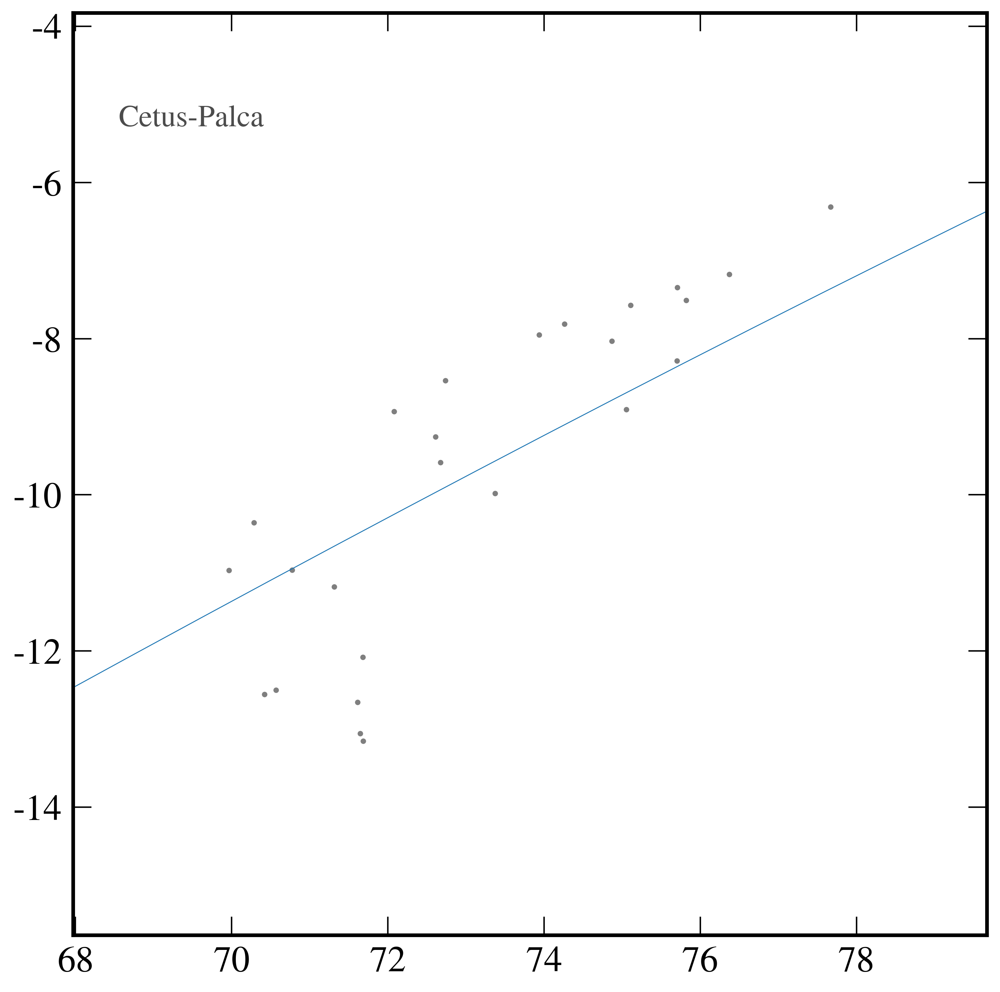

In [20]:
stream = 'Cetus-Palca'
p = pickle.load( open('../data/orbits/fits/{:s}.pkl'.format(stream), 'rb'))

# plot
plt.plot(p['c_fr'].phi1.wrap_at(180*u.deg), p['c_fr'].phi2, 'ko', mew=0, ms=3, alpha=0.5, rasterized=True)

if stream=='Sagittarius':
    ind_plot = (p['orbit'].t>-400*u.Myr) & (p['orbit'].t<790*u.Myr)
    plt.plot(p['orbit_fr'].phi1.wrap_at(180*u.deg)[ind_plot], p['orbit_fr'].phi2[ind_plot], '-', lw=0.5)
elif stream=='Cetus-Palca':
    ind_plot = (p['orbit'].t>-10*u.Myr) & (p['orbit'].t<10*u.Myr)
    plt.plot(p['orbit_fr'].phi1.wrap_at(180*u.deg)[ind_plot], p['orbit_fr'].phi2[ind_plot], '-', lw=0.5)
else:
    plt.plot(p['orbit_fr'].phi1.wrap_at(180*u.deg), p['orbit_fr'].phi2, '-', lw=0.5)

plt.xlim(np.min(p['c_fr'].phi1.value)-2, np.max(p['c_fr'].phi1.value)+2)
plt.ylim(np.min(p['c_fr'].phi2.value)-2, np.max(p['c_fr'].phi2.value)+2)
plt.gca().set_aspect('equal', adjustable='datalim')
plt.text(0.05, 0.9, stream, transform=plt.gca().transAxes, va='top', fontsize='small', alpha=0.7)

plt.tight_layout()

In [21]:
# summary figure
# set up figure geometry
nstream = len(published)
ncol = 4
nrow = int(np.ceil(nstream/ncol))
print(nstream, nrow, ncol)

fs = 3
fw = 8*fs
fh = 10*fs
fig, ax = plt.subplots(nrow, ncol, figsize=(fw,fh))

for i in range(nstream):
    irow = i // ncol
    icol = i % ncol
    plt.sca(ax[irow][icol])
    
    # load stream
    stream = published[i]
    p = pickle.load( open('../data/orbits/fits/{:s}.pkl'.format(stream), 'rb'))
    
    # plot
    plt.plot(p['c_fr'].phi1.wrap_at(180*u.deg), p['c_fr'].phi2, 'ko', mew=0, ms=3, alpha=0.5, rasterized=True)
    
    if stream=='Sagittarius':
        ind_plot = (p['orbit'].t>-400*u.Myr) & (p['orbit'].t<790*u.Myr)
        plt.plot(p['orbit_fr'].phi1.wrap_at(180*u.deg)[ind_plot], p['orbit_fr'].phi2[ind_plot], '-', lw=0.5)
    elif stream=='Cetus-Palca':
        ind_plot = (p['orbit'].t>-10*u.Myr) & (p['orbit'].t<10*u.Myr)
        plt.plot(p['orbit_fr'].phi1.wrap_at(180*u.deg)[ind_plot], p['orbit_fr'].phi2[ind_plot], '-', lw=0.5)
    else:
        plt.plot(p['orbit_fr'].phi1.wrap_at(180*u.deg), p['orbit_fr'].phi2, '-', lw=0.5)
    
    plt.xlim(np.min(p['c_fr'].phi1.value)-2, np.max(p['c_fr'].phi1.value)+2)
    plt.ylim(np.min(p['c_fr'].phi2.value)-2, np.max(p['c_fr'].phi2.value)+2)
    plt.gca().set_aspect('equal', adjustable='datalim')
    plt.text(0.05, 0.9, published[i], transform=plt.gca().transAxes, va='top', fontsize='small', alpha=0.7)

# labels
for i in range(nrow):
    plt.sca(ax[i][0])
    plt.ylabel('$\phi_2$ [$^\circ$]')

for i in range(ncol):
    plt.sca(ax[nrow-1][i])
    plt.xlabel('$\phi_1$ [$^\circ$]')

plt.tight_layout(h_pad=0, w_pad=0)
plt.savefig('../tex/figures/all_members_sky.pdf', dpi=300)

92 23 4


In [15]:
fs = 3
fw = 8*fs
fh = 10*fs
fig, ax = plt.subplots(nrow, ncol, figsize=(fw,fh))

wangle = 180*u.deg

for i in range(nstream):
    irow = i // ncol
    icol = i % ncol
    plt.sca(ax[irow][icol])
    
    ind_plot = tall['name']==published[i]
    c_ = coord.SkyCoord(ra=tall['ra'][ind_plot], dec=tall['dec'][ind_plot], frame='icrs')
    cs_ = c_.transform_to(mwstreams[dict_invgalstreams[published[i]]].stream_frame)
    
    plt.plot(cs_.phi1.wrap_at(180*u.deg), cs_.phi2, 'ko', mew=0, ms=2, rasterized=True)
#     plt.plot(tall['ra'][ind_plot], tall['dec'][ind_plot], 'ko', mew=0, ms=2, rasterized=True)

    name = psum['name'][psum['ibata2023_sID']==i+1][0]
    p = pall[i+1]
    ind_segment = ((p['orbit_fr'].phi1.wrap_at(wangle)<np.max(p['c_fr'].phi1.wrap_at(wangle)) + 2*u.deg)
                   & (p['orbit_fr'].phi1.wrap_at(wangle)>np.min(p['c_fr'].phi1.wrap_at(wangle)) - 2*u.deg)
                  & (p['orbit_fr'].phi2<np.max(p['c_fr'].phi2) + 2*u.deg)
                  & (p['orbit_fr'].phi2>np.min(p['c_fr'].phi2) - 2*u.deg))
    
    plt.plot(p['c_fr'].phi1.wrap_at(wangle), p['c_fr'].phi2, 'ko', mew=0, ms=3)
    plt.plot(p['orbit_fr'].phi1.wrap_at(wangle)[ind_segment], p['orbit_fr'].phi2[ind_segment], '-', lw=0.5)
    
    plt.gca().set_aspect('equal', adjustable='datalim')
    plt.text(0.05, 0.9, published[i], transform=plt.gca().transAxes, va='top', fontsize='small', alpha=0.7)

# labels
for i in range(nrow):
    plt.sca(ax[i][0])
    plt.ylabel('$\phi_2$ [$^\circ$]')

for i in range(ncol):
    plt.sca(ax[nrow-1][i])
    plt.xlabel('$\phi_1$ [$^\circ$]')
 
plt.tight_layout(h_pad=0, w_pad=0)
plt.savefig('../tex/figures/all_members_sky.pdf', dpi=300)

KeyError: 56

## Figure: Streams with multiple catalogs

In [40]:
ind_multi = ncatalog>1

In [41]:
multi = np.array(names)[ind_multi].tolist()

In [42]:
multi, ncatalog[ind_multi]

(['ATLAS-Aliqa Uma',
  'GD-1',
  'Indus',
  'Jhelum',
  'M2',
  'M3',
  'M5',
  'Orphan-Chenab',
  'Phoenix',
  'Tucana III'],
 array([3, 3, 2, 3, 2, 2, 2, 3, 2, 2]))

In [45]:
for stream in multi:
    print(stream)
    catalogs = member_origin[stream]
    
    for catalog in catalogs:
        ind_ = (tall['name']==stream) & (tall['reference']==catalog)
        print(catalog, np.sum(ind_))
    

ATLAS-Aliqa Uma
Ibata2024 208
Li2021 96
Shipp2019 30
GD-1
Huang2019 67
Bonaca2020 43
Ibata2024 1468
Indus
Ibata2024 1021
Shipp2019 25
Jhelum
Ibata2024 986
Shipp2019 22
Awad2024 76
M2
Grillmair2022 125
Ibata2024 15
M3
Ibata2024 234
Yang2023 11
M5
Grillmair2019 50
Ibata2024 91
Orphan-Chenab
Shipp2019 5
Ibata2024 850
Koposov2023 357
Phoenix
Ibata2024 58
Shipp2019 13
Tucana III
Ibata2024 102
Shipp2019 23


In [62]:
# Custom triangular marker (centered)
triangle_marker = (3, 0, 0)  # (num_sides, rotation, angle)

# marker plotting styles, ordered by number of points in the catalog
markers = [dict(marker='o', color='#1e2477', ms=2),
          dict(marker=triangle_marker, mec='#3593f8', mfc='none', ms=8),
          dict(marker='o', mec='#21d7ff', mfc='none', ms=10)]

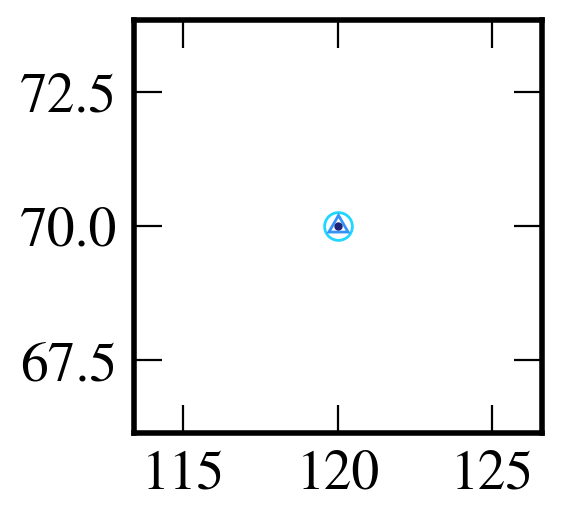

In [89]:
# test markers
ra, dec = 120, 70

plt.figure(figsize=(3,3))

plt.plot(ra, dec, **markers[2])
plt.plot(ra, dec, **markers[1])
plt.plot(ra, dec, **markers[0])

plt.tight_layout()

GD-1
Ibata2024 1468
Huang2019 67
Bonaca2020 43


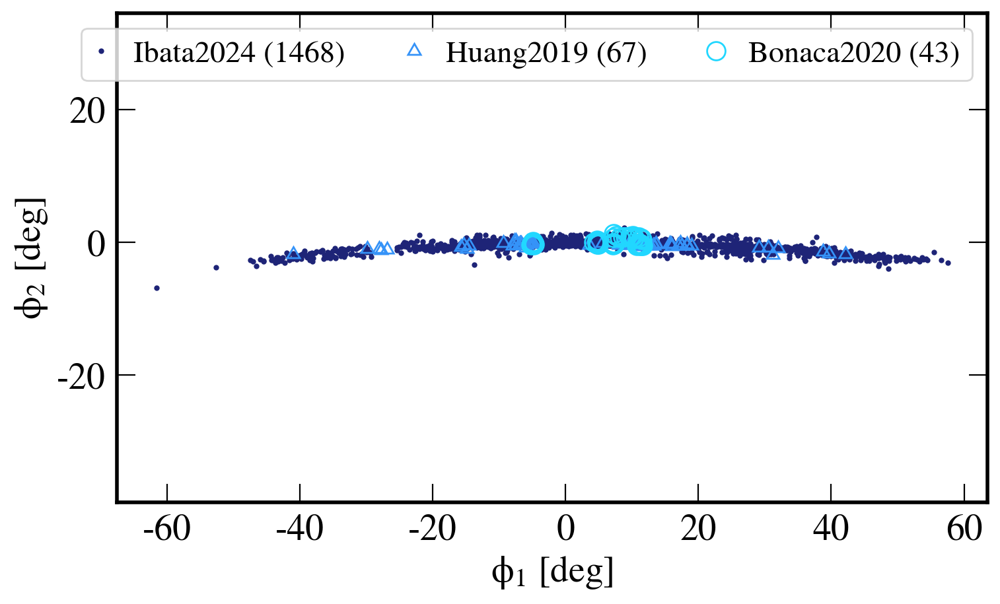

In [87]:
# test stream
plt.figure(figsize=(8,5))
for stream in multi[1:2]:
    print(stream)
    catalogs = member_origin[stream]
    
    # sort catalogs
    nstar = []
    for e, catalog in enumerate(catalogs):
        ind_plot = (tall['name']==stream) & (tall['reference']==catalog)
        nstar += [np.sum(ind_plot)]
    ind_sort = np.argsort(np.array(nstar))[::-1]
    sorted_catalogs = np.array(catalogs)[ind_sort]
    
    for e, catalog in enumerate(sorted_catalogs):
        ind_plot = (tall['name']==stream) & (tall['reference']==catalog)
        print(catalog, np.sum(ind_plot))
        
        c_ = coord.SkyCoord(ra=tall['ra'][ind_plot], dec=tall['dec'][ind_plot], frame='icrs')
        cs_ = c_.transform_to(mwstreams[dict_invgalstreams[stream]].stream_frame)

        plt.plot(cs_.phi1.wrap_at(180*u.deg), cs_.phi2, **markers[e], lw=0,
                 label=f'{catalog} ({np.sum(ind_plot)})')
        
plt.legend(fontsize='small', handlelength=0.5, ncols=3)
plt.xlabel('$\phi_1$ [deg]')
plt.ylabel('$\phi_2$ [deg]')
plt.gca().set_aspect('equal', adjustable='datalim')
plt.tight_layout()

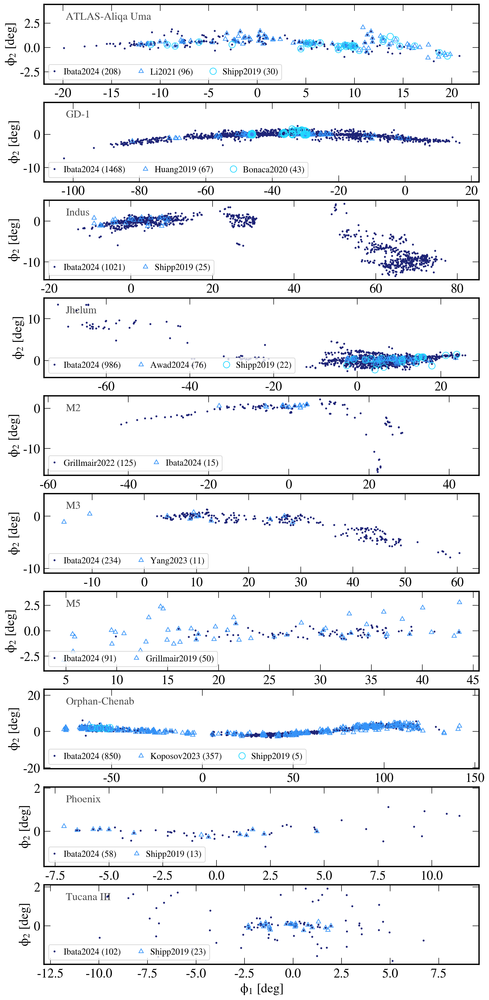

In [104]:
# all streams

fig, ax = plt.subplots(10,1,figsize=(11,22))

for i, stream in enumerate(multi[:]):
    plt.sca(ax[i])
    catalogs = member_origin[stream]
    
    # sort catalogs
    nstar = []
    for e, catalog in enumerate(catalogs):
        ind_plot = (tall['name']==stream) & (tall['reference']==catalog)
        nstar += [np.sum(ind_plot)]
    ind_sort = np.argsort(np.array(nstar))[::-1]
    sorted_catalogs = np.array(catalogs)[ind_sort]
    
    for e, catalog in enumerate(sorted_catalogs):
        ind_plot = (tall['name']==stream) & (tall['reference']==catalog)
        
        c_ = coord.SkyCoord(ra=tall['ra'][ind_plot], dec=tall['dec'][ind_plot], frame='icrs')
        cs_ = c_.transform_to(mwstreams[dict_invgalstreams[stream]].stream_frame)

        plt.plot(cs_.phi1.wrap_at(180*u.deg), cs_.phi2, **markers[e], lw=0,
                 label=f'{catalog} ({np.sum(ind_plot)})')
    
    plt.text(0.05, 0.9, stream, transform=plt.gca().transAxes, va='top', fontsize='small', alpha=0.7)
    plt.legend(loc=3, fontsize='x-small', handlelength=0.5, ncols=3)
    plt.ylabel('$\phi_2$ [deg]')
    plt.gca().set_aspect('equal', adjustable='datalim')

plt.xlabel('$\phi_1$ [deg]')

plt.tight_layout(h_pad=0, w_pad=0)
plt.savefig('../tex/figures/comparison_members_sky.pdf', dpi=300)